c:\Users\MILab\.conda\envs\hr\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


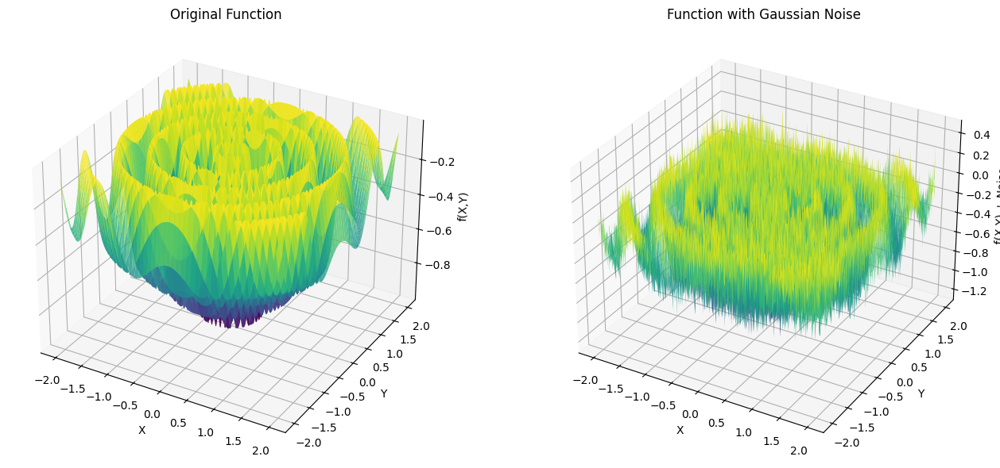

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split

# Step 1: Generate data points
x = np.linspace(-2, 2, 500)
y = np.linspace(-2, 2, 500)
X, Y = np.meshgrid(x, y)
f = -(1 + np.cos(12 * np.sqrt(X**2 + Y**2))) / (0.5 * (X**2 + Y**2) + 2)

# Step 2: Add Gaussian noise
noise = 0.1 * np.random.randn(*f.shape)
f_noisy = f + noise

# Creating a figure for subplotting
fig = plt.figure(figsize=(14, 6))

# Subplot 1: Original Function
ax1 = fig.add_subplot(121, projection='3d')
surf1 = ax1.plot_surface(X, Y, f, cmap='viridis', edgecolor='none', rstride=10, cstride=10, alpha=0.8)
ax1.set_title('Original Function')
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('f(X,Y)')

# Subplot 2: Function with Gaussian Noise
ax2 = fig.add_subplot(122, projection='3d')
surf2 = ax2.plot_surface(X, Y, f_noisy, cmap='viridis', edgecolor='none', rstride=10, cstride=10, alpha=0.8)
ax2.set_title('Function with Gaussian Noise')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_zlabel('f(X,Y) + Noise')

plt.tight_layout()
plt.show()


In [2]:

#make 2 dim to 1 dim 
onedim_X = X.flatten()
onedim_Y = Y.flatten()
onedim_f = f_noisy.flatten()
# Combine X and Y into a single array of input features
features = np.column_stack((onedim_X, onedim_Y))
targets = onedim_f

In [3]:
def plot3d(mlp,features,device,hidden_size):
    features = torch.Tensor(features).to(device)    
    output = mlp(features)
    output = output.reshape(500,500).detach().cpu().numpy()
    # Creating a figure for subplotting
    fig = plt.figure(figsize=(14, 6))

    # Subplot 1: Original Function
    ax1 = fig.add_subplot(121, projection='3d')
    surf1 = ax1.plot_surface(X, Y, f_noisy, cmap='viridis', edgecolor='none', rstride=10, cstride=10, alpha=0.8)
    ax1.set_title('Function with Gaussian Noise')
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('f(X,Y) + Noise')

    # Subplot 2: Function with Gaussian Noise
    ax2 = fig.add_subplot(122, projection='3d')
    surf2 = ax2.plot_surface(X, Y, output, cmap='viridis', edgecolor='none', rstride=10, cstride=10, alpha=0.8)
    ax2.set_title(f'Function with trained MLP with hidden neuron {hidden_size}')
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_zlabel('MLP(X,Y)')

    plt.tight_layout()
    plt.show()

8  hidden_size is testing


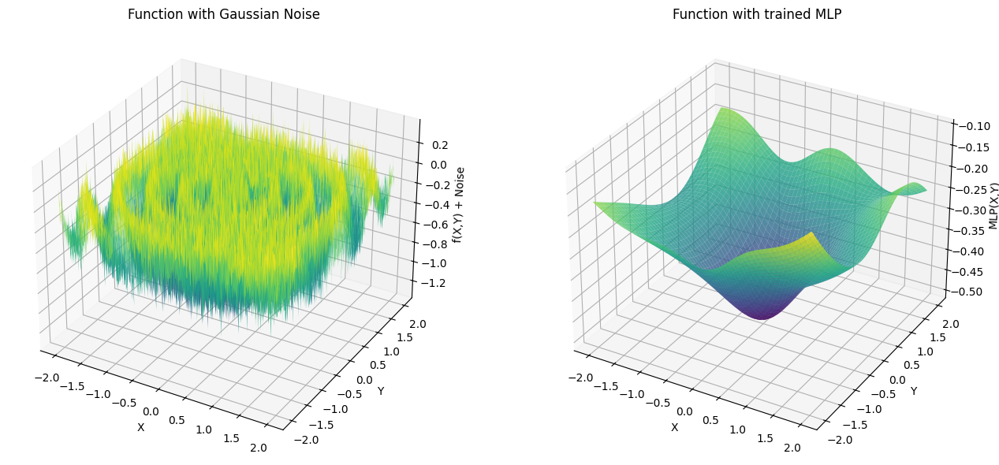

24  hidden_size is testing


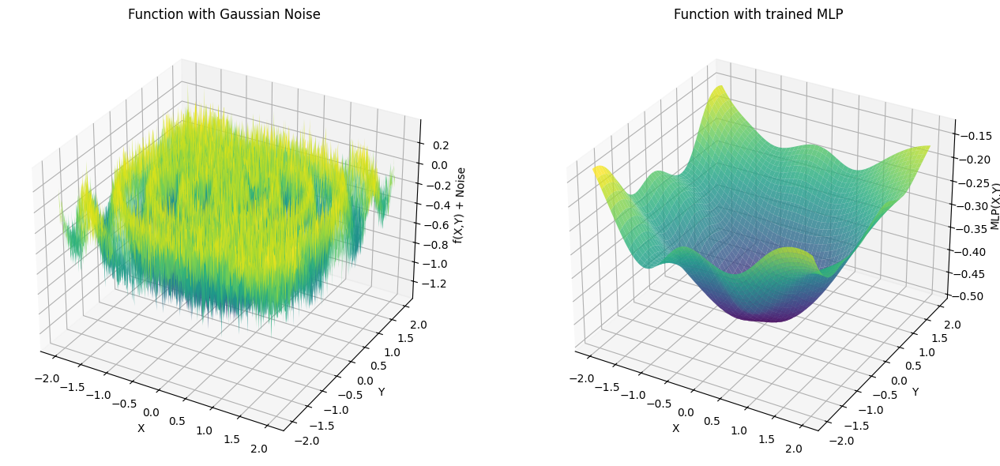

40  hidden_size is testing


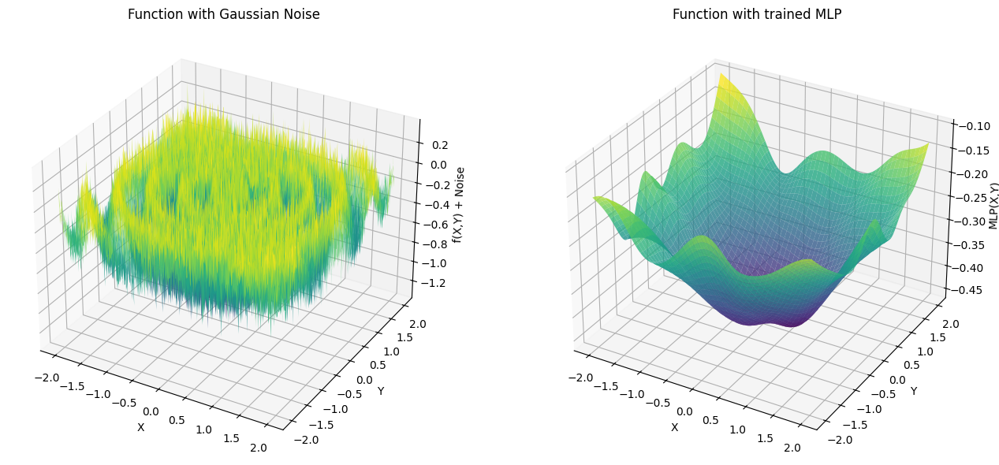

56  hidden_size is testing


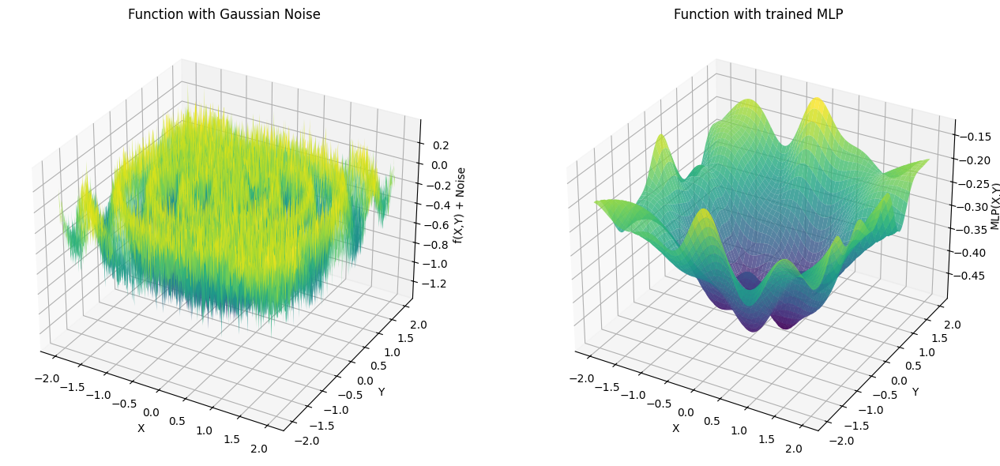

72  hidden_size is testing


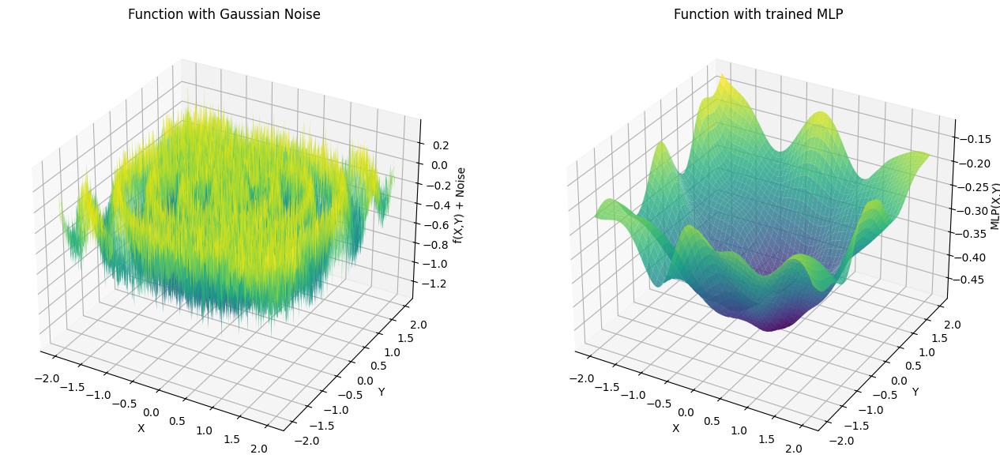

{8: [0.25263269479942124, 0.25684134088085003, 0.25410427515159845], 24: [0.25358880846474674, 0.2539304250376019, 0.25279527222088966], 40: [0.25336944444418324, 0.25379629814017207, 0.25327132254478313], 56: [0.2523394867576881, 0.25270837509398775, 0.25153636134686785], 72: [0.2520463893212791, 0.25250613037614394, 0.25349113489179426]}
Best hidden layer size: 56 with RMSE: 0.2521947410661812


In [4]:
#K-fold configuration

#define model for adjustment
class MLP(nn.Module):
    def __init__(self, num_hidden_neurons):
        super(MLP, self).__init__()
        self.layer1 = nn.Linear(2, num_hidden_neurons)
        self.tanh = nn.Tanh()
        self.layer2 = nn.Linear(num_hidden_neurons, 1)
        
        #standard Gaussian initialization 
        nn.init.normal_(self.layer1.weight, mean = 0., std = 1.)
        nn.init.normal_(self.layer2.weight, mean = 0., std = 1.)

    def forward(self, x):
        return self.layer2(self.tanh(self.layer1(x)))

# Define hidden layer sizes to test
hidden_layer_sizes = [8, 24, 40, 56, 72]

# Dictionary to store the RMSE for each hidden layer size
rmse_scores = {size: [] for size in hidden_layer_sizes}
train_rmse_scores ={size: [] for size in hidden_layer_sizes}
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
epochs = 50

X_select, X_test, y_select, y_test = train_test_split(features, targets, test_size=0.15)

# Loop over each hidden layer size
for hidden_size in hidden_layer_sizes:    
    print(hidden_size," hidden_size is testing")

    # Perform 3-fold cross-validation    
    for fold in range(3):        
        X_train, X_val, y_train, y_val = train_test_split(X_select, y_select, test_size=3/17)

        X_torch = torch.tensor(X_train, dtype=torch.float32)
        y_torch = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)
        X_val_torch = torch.tensor(X_val, dtype=torch.float32)
        y_val_torch = torch.tensor(y_val, dtype=torch.float32).view(-1, 1)

        traindataset = TensorDataset(X_torch, y_torch)
        valdataset = TensorDataset(X_val_torch, y_val_torch)
        
        train_loader = DataLoader(traindataset, batch_size=32, shuffle=True)
        val_loader = DataLoader(valdataset, batch_size=32, shuffle=False)
        
        # Initialize the MLP model
        mlp = MLP(hidden_size).to(device)

        # Define the loss function and the optimizer
        criterion = nn.MSELoss()
        optimizer = optim.SGD(mlp.parameters(), lr=1e-3)
        # optimizer = optim.Adam(mlp.parameters(),lr = 1e-2, weight_decay=5e-4)
        # scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min')
        scheduler = optim.lr_scheduler.StepLR(optimizer,step_size = 10, gamma = 0.5)
        # Train the model for the current fold
        mlp.train()
        for epoch in range(epochs):
            losses = []
            for X_batch, y_batch in train_loader:
                X_batch = X_batch.to(device)
                y_batch = y_batch.to(device)
                optimizer.zero_grad()
                output = mlp(X_batch)
                loss = criterion(output, y_batch)
                losses.append(loss.item())
                loss.backward()
                optimizer.step()
        fold_rmse = np.sqrt(np.mean(losses))
        train_rmse_scores[hidden_size].append(fold_rmse)
        scheduler.step()
        # Evaluate the model on the validation set for the current fold
        mlp.eval()
        with torch.no_grad():
            val_losses = []
            for X_batch, y_batch in val_loader:
                X_batch = X_batch.to(device)
                y_batch = y_batch.to(device)
                val_predictions = mlp(X_batch)
                val_loss = criterion(val_predictions, y_batch)
                val_losses.append(val_loss.item())
            fold_rmse = np.sqrt(np.mean(val_losses))
            rmse_scores[hidden_size].append(fold_rmse)
        print("hidden neurons number: " ,hidden_size,"of rmse score is ", fold_rmse)
    plot3d(mlp,features,device)
print(rmse_scores)
        
# Calculate the average RMSE for each hidden layer size
average_rmse_scores = {size: np.mean(scores) for size, scores in rmse_scores.items()}

# Find the hidden layer size with the lowest average RMSE
best_hidden_size = min(average_rmse_scores, key=average_rmse_scores.get)
best_rmse = average_rmse_scores[best_hidden_size]

print(f"Best hidden layer size: {best_hidden_size} with RMSE: {best_rmse}")



test of 2-fold start!
hidden neurons number:  8 of rmse score is  0.25418314733265135
hidden neurons number:  8 of rmse score is  0.25287921266204083
hidden neurons number:  8 of rmse score is  0.25666550841489494
hidden neurons number:  8 of rmse score is  0.25652304499057654
hidden neurons number:  8 of rmse score is  0.25503128912465467
hidden neurons number:  8 of rmse score is  0.255232983027566


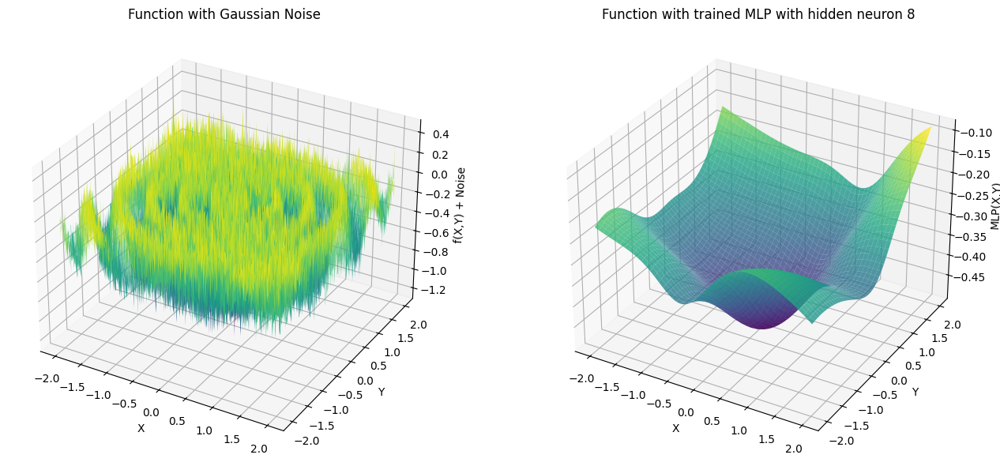

hidden neurons number:  24 of rmse score is  0.2533639553538379
hidden neurons number:  24 of rmse score is  0.2539226931387544
hidden neurons number:  24 of rmse score is  0.2538185073547955
hidden neurons number:  24 of rmse score is  0.2549110250041069
hidden neurons number:  24 of rmse score is  0.25310985407596287
hidden neurons number:  24 of rmse score is  0.2531958320671885


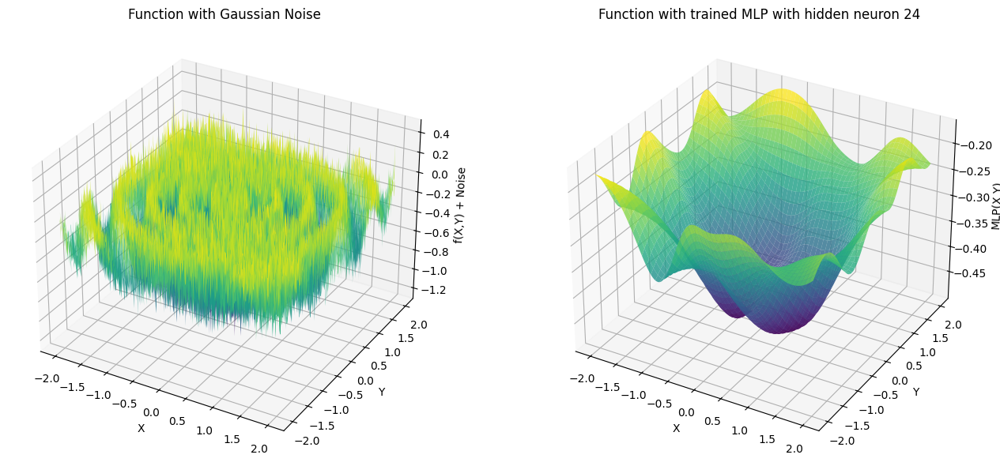

hidden neurons number:  40 of rmse score is  0.2534346887565033
hidden neurons number:  40 of rmse score is  0.253579184626588
hidden neurons number:  40 of rmse score is  0.2535425563046978
hidden neurons number:  40 of rmse score is  0.2520952154158764
hidden neurons number:  40 of rmse score is  0.2532384904211325
hidden neurons number:  40 of rmse score is  0.25313578551938265


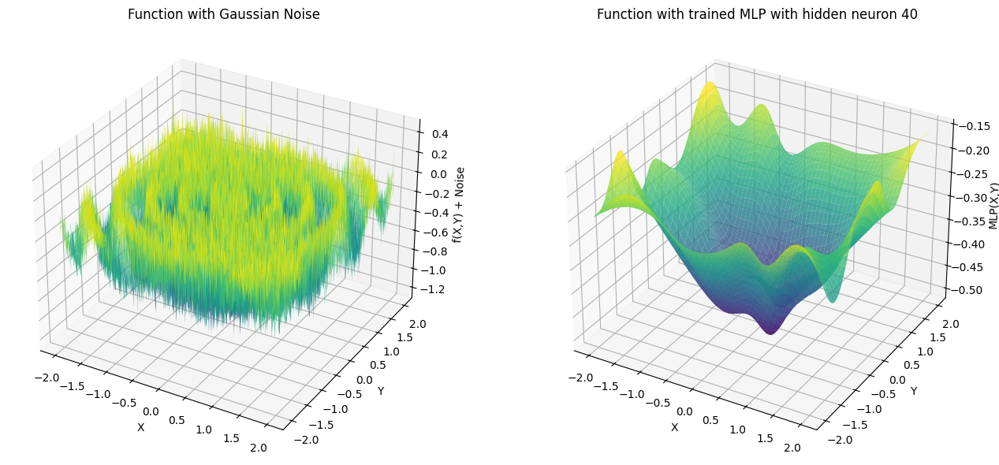

hidden neurons number:  56 of rmse score is  0.2535732217532704
hidden neurons number:  56 of rmse score is  0.254386404631527
hidden neurons number:  56 of rmse score is  0.2530098001914385
hidden neurons number:  56 of rmse score is  0.25373934077339694
hidden neurons number:  56 of rmse score is  0.2532702114795482
hidden neurons number:  56 of rmse score is  0.2541873907815693


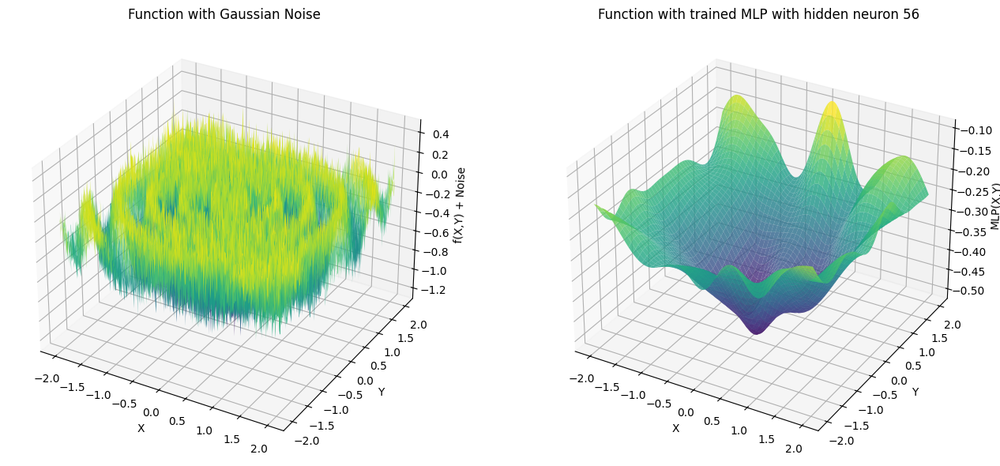

hidden neurons number:  72 of rmse score is  0.2531403974776952
hidden neurons number:  72 of rmse score is  0.2535614443667801
hidden neurons number:  72 of rmse score is  0.2532813891683406
hidden neurons number:  72 of rmse score is  0.2525097642136614
hidden neurons number:  72 of rmse score is  0.25301251036005057
hidden neurons number:  72 of rmse score is  0.2541283689625507


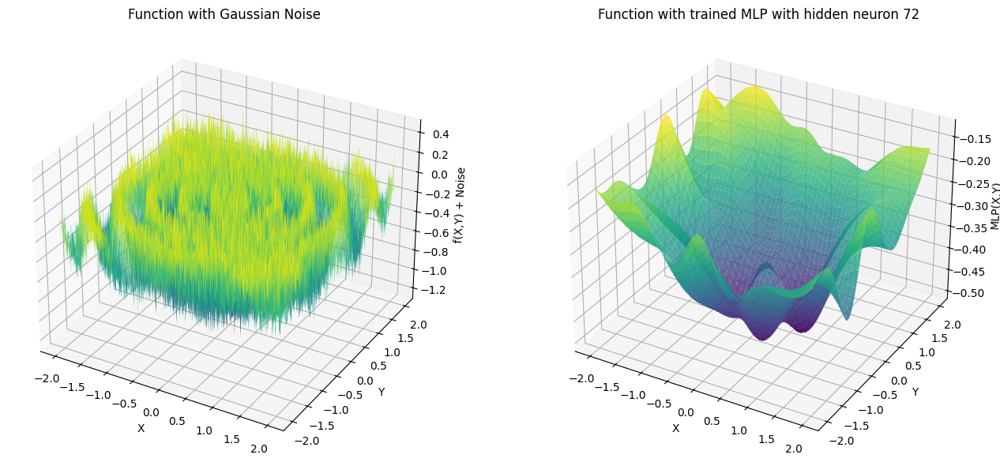

Best hidden layer size: 40 with RMSE: 0.2529367285206157
At that time, test RMSE is[0.2534789889117022]
test of 3-fold start!
hidden neurons number:  8 of rmse score is  0.2533358896535345
hidden neurons number:  8 of rmse score is  0.25443179661823595
hidden neurons number:  8 of rmse score is  0.25527988852833455
hidden neurons number:  8 of rmse score is  0.2554154021552299
hidden neurons number:  8 of rmse score is  0.25431855182938756
hidden neurons number:  8 of rmse score is  0.2532447824414689


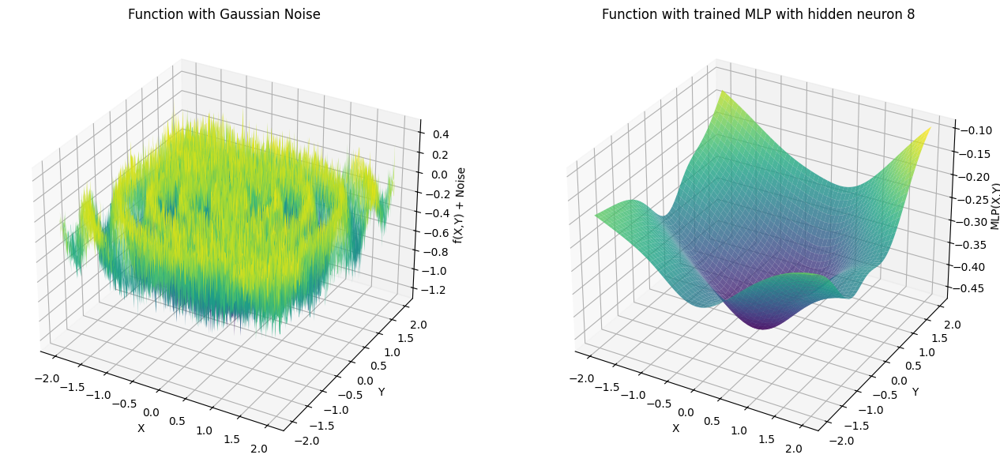

hidden neurons number:  24 of rmse score is  0.25341416863169136
hidden neurons number:  24 of rmse score is  0.2534242357414575
hidden neurons number:  24 of rmse score is  0.25350363202061665
hidden neurons number:  24 of rmse score is  0.2529216117840932
hidden neurons number:  24 of rmse score is  0.25376370928082903
hidden neurons number:  24 of rmse score is  0.2533458722002719


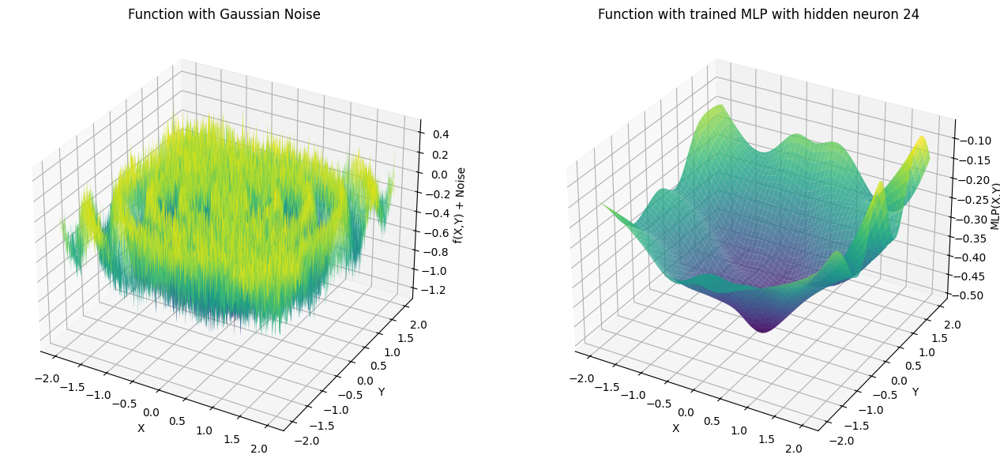

hidden neurons number:  40 of rmse score is  0.2527233272929503
hidden neurons number:  40 of rmse score is  0.25215342186857953
hidden neurons number:  40 of rmse score is  0.25297229113190695
hidden neurons number:  40 of rmse score is  0.2527679601870051
hidden neurons number:  40 of rmse score is  0.2539816943130104
hidden neurons number:  40 of rmse score is  0.25382357268044214


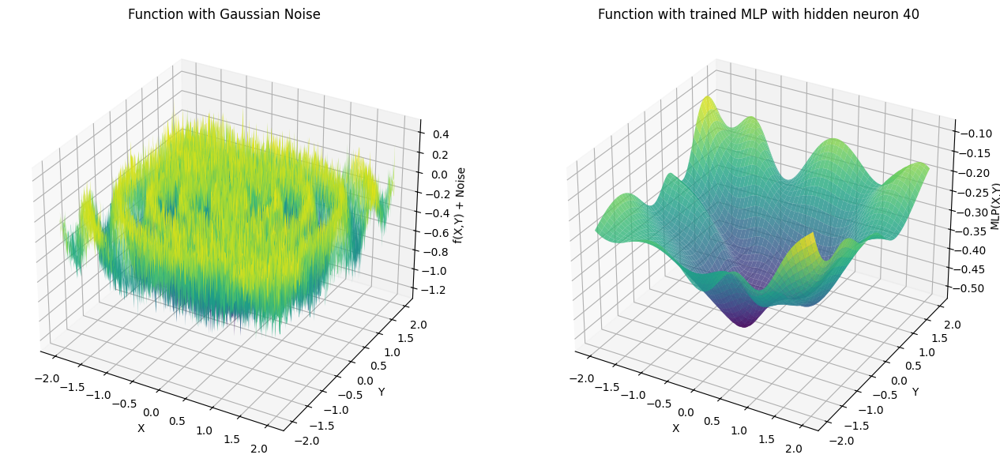

hidden neurons number:  56 of rmse score is  0.2533239969464798
hidden neurons number:  56 of rmse score is  0.2538404174570842
hidden neurons number:  56 of rmse score is  0.2532888260838089
hidden neurons number:  56 of rmse score is  0.2538478809609413
hidden neurons number:  56 of rmse score is  0.2529122877918647
hidden neurons number:  56 of rmse score is  0.2529381472736035


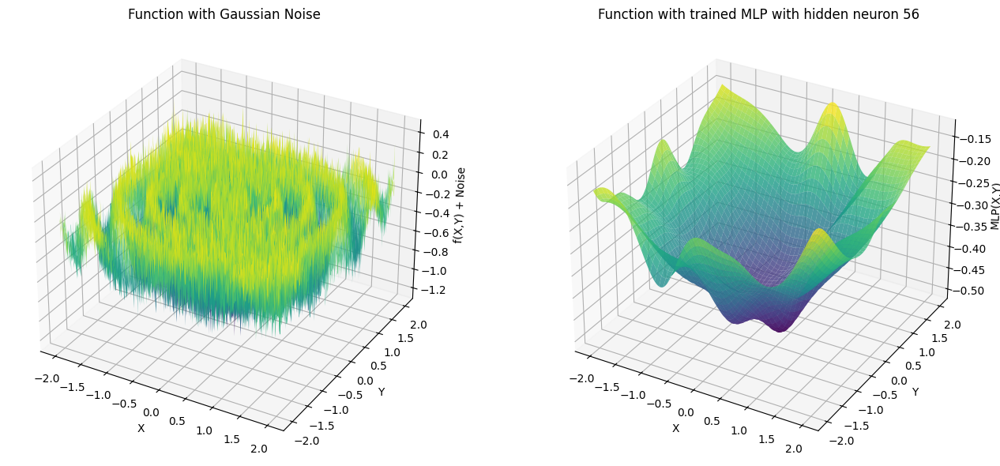

hidden neurons number:  72 of rmse score is  0.25319782459063317
hidden neurons number:  72 of rmse score is  0.2522268136220355
hidden neurons number:  72 of rmse score is  0.25344974932917363
hidden neurons number:  72 of rmse score is  0.25395604464932864
hidden neurons number:  72 of rmse score is  0.25360613983919184
hidden neurons number:  72 of rmse score is  0.25437175796636635


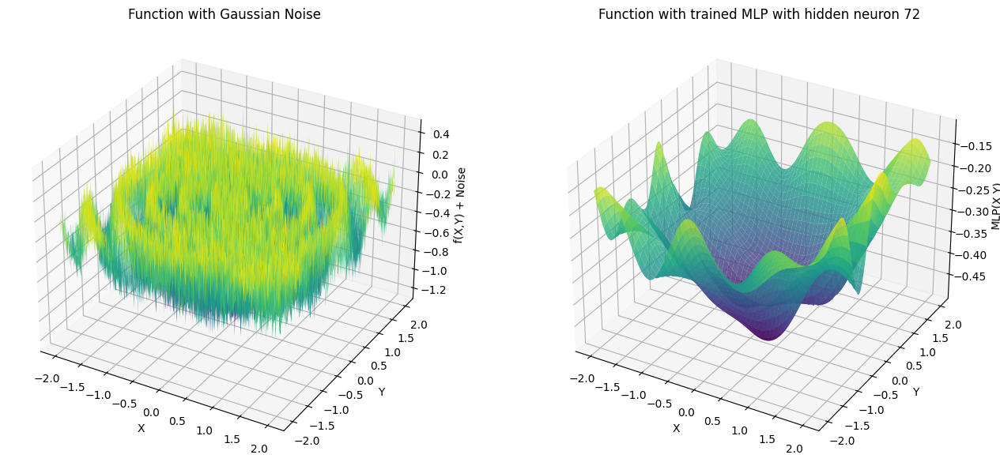

Best hidden layer size: 40 with RMSE: 0.2529149849120089
At that time, test RMSE is[0.25409438703213977]


In [4]:
#K-fold configuration
from sklearn.model_selection import KFold
from torch.utils.data import TensorDataset, DataLoader, Subset

#define model for adjustment
class MLP(nn.Module):
    def __init__(self, num_hidden_neurons):
        super(MLP, self).__init__()
        self.layer1 = nn.Linear(2, num_hidden_neurons)
        self.tanh = nn.Tanh()
        self.layer2 = nn.Linear(num_hidden_neurons, 1)

        #standard Gaussian initialization
        nn.init.normal_(self.layer1.weight, mean = 0., std = 1.)
        nn.init.normal_(self.layer2.weight, mean = 0., std = 1.)
        # nn.init.xavier_uniform_(self.layer1.weight)
        # nn.init.xavier_uniform_(self.layer2.weight)

    def forward(self, x):
        return self.layer2(self.tanh(self.layer1(x)))

hidden_layer_sizes = [8, 24, 40, 56, 72]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
epochs = 30

for testfold in range(1,3):
    print(f'test of {testfold+1}-fold start!')
    # Create PyTorch datasets for the current fold
    X_select, X_test, y_select, y_test = train_test_split(features, targets, test_size=0.15)
    X_test_torch = torch.tensor(X_test, dtype=torch.float32)
    y_test_torch = torch.tensor(y_test, dtype=torch.float32).view(-1, 1)
    testdataaset = TensorDataset(X_test_torch, y_test_torch)
    test_loader = DataLoader(testdataaset, batch_size=512, shuffle=False)
    #Dictionary to store the RMSE for each hidden layer size
    rmse_scores = {size: [] for size in hidden_layer_sizes}
    train_rmse_scores = {size: [] for size in hidden_layer_sizes}
    test_scores = {size: [] for size in hidden_layer_sizes}
    for hidden_size in hidden_layer_sizes:

        for fold in range(3):
            X_train, X_val, y_train, y_val = train_test_split(X_select, y_select, test_size=3/17)

            X_torch = torch.tensor(X_train, dtype=torch.float32)
            y_torch = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)
            X_val_torch = torch.tensor(X_val, dtype=torch.float32)
            y_val_torch = torch.tensor(y_val, dtype=torch.float32).view(-1, 1)

            traindataset = TensorDataset(X_torch, y_torch)
            valdataset = TensorDataset(X_val_torch, y_val_torch)

            train_loader = DataLoader(traindataset, batch_size=32, shuffle=True)
            val_loader = DataLoader(valdataset, batch_size=32, shuffle=False)

            mlp = MLP(hidden_size).to(device)

            # Define the loss function and the optimizer
            criterion = nn.MSELoss()
            optimizer = optim.SGD(mlp.parameters(), lr=1e-3)
            scheduler = optim.lr_scheduler.StepLR(optimizer,step_size = 10, gamma = 0.5)

            # Train the model for the current fold
            mlp.train()
            for epoch in range(epochs):
                losses = []
                for X_batch, y_batch in train_loader:
                    X_batch = X_batch.to(device)
                    y_batch = y_batch.to(device)
                    optimizer.zero_grad()
                    output = mlp(X_batch)
                    loss = criterion(output, y_batch)
                    losses.append(loss.item())
                    loss.backward()
                    optimizer.step()
            fold_rmse = np.sqrt(np.mean(losses))
            train_rmse_scores[hidden_size].append(fold_rmse)
            scheduler.step()            
            print("hidden neurons number: " ,hidden_size,"of rmse score is ", fold_rmse)
            # Evaluate the model on the validation set for the current fold
            mlp.eval()
            with torch.no_grad():
                val_losses = []
                for X_batch, y_batch in val_loader:
                    X_batch = X_batch.to(device)
                    y_batch = y_batch.to(device)
                    val_predictions = mlp(X_batch)
                    val_loss = criterion(val_predictions, y_batch)
                    val_losses.append(val_loss.item())
                fold_rmse = np.sqrt(np.mean(val_losses))
                rmse_scores[hidden_size].append(fold_rmse)
            print("hidden neurons number: " ,hidden_size,"of rmse score is ", fold_rmse)
        plot3d(mlp,features,device,hidden_size)
        with torch.no_grad():
            test_losses = []
            for X_batch, y_batch in test_loader:
                X_batch = X_batch.to(device)
                y_batch = y_batch.to(device)
                test_predictions = mlp(X_batch)
                test_loss = criterion(test_predictions, y_batch)
                test_losses.append(test_loss.item())
            fold_rmse = np.sqrt(np.mean(test_losses))
            test_scores[hidden_size].append(fold_rmse)
     
    # Calculate the average RMSE for each hidden layer size
    average_rmse_scores = {size: np.mean(scores) for size, scores in rmse_scores.items()}
    # Find the hidden layer size with the lowest average RMSE
    best_hidden_size = min(average_rmse_scores, key=average_rmse_scores.get)
    best_rmse = average_rmse_scores[best_hidden_size]

    print(f"Best hidden layer size: {best_hidden_size} with RMSE: {best_rmse}")
    print(f"At that time, test RMSE is{test_scores[best_hidden_size]}") 

test 1 -fold start
hidden neurons number:  8 of rmse score is  0.2522105556070538
hidden neurons number:  8 of rmse score is  0.2515197549790771
hidden neurons number:  8 of rmse score is  0.25423975198565407


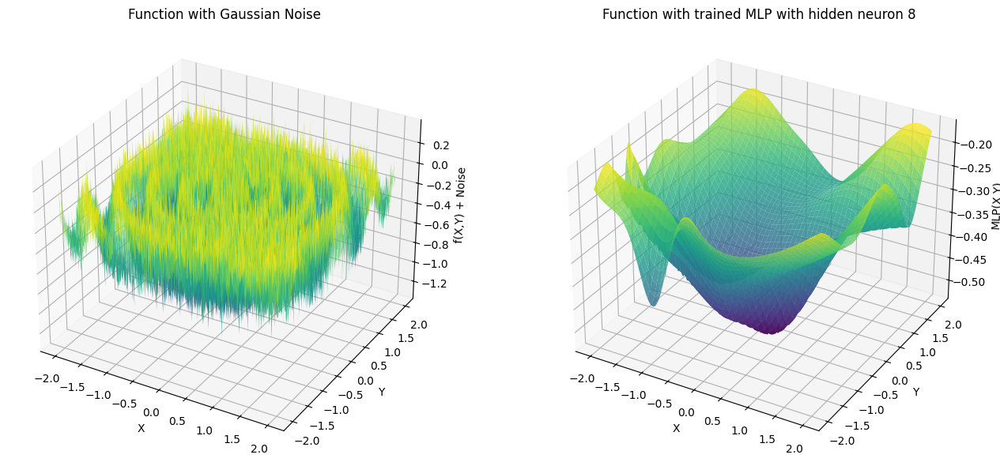

hidden neurons number:  24 of rmse score is  0.23658490497127888
hidden neurons number:  24 of rmse score is  0.23980798537475023
hidden neurons number:  24 of rmse score is  0.24003023576486193


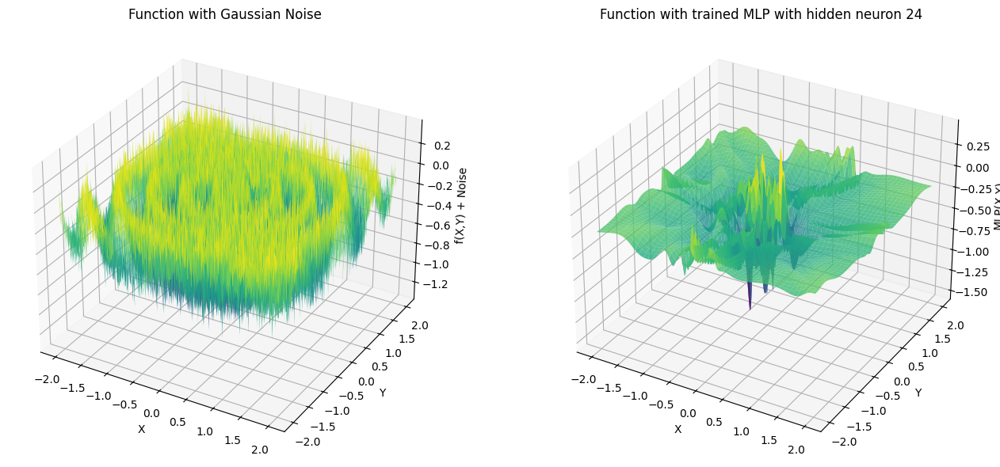

hidden neurons number:  40 of rmse score is  0.22156979591553294
hidden neurons number:  40 of rmse score is  0.22469663565833023
hidden neurons number:  40 of rmse score is  0.22804710584948282


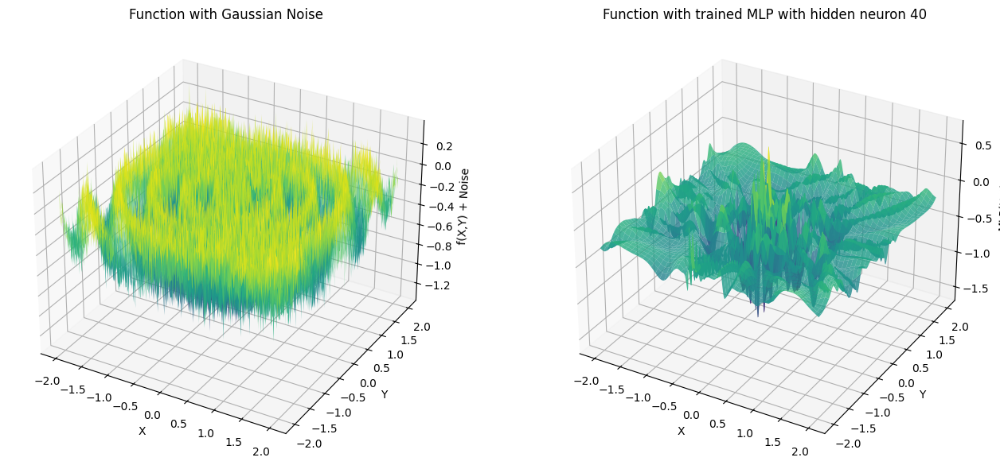

hidden neurons number:  56 of rmse score is  0.20838486220551586
hidden neurons number:  56 of rmse score is  0.2247193551423511
hidden neurons number:  56 of rmse score is  0.20626150096253046


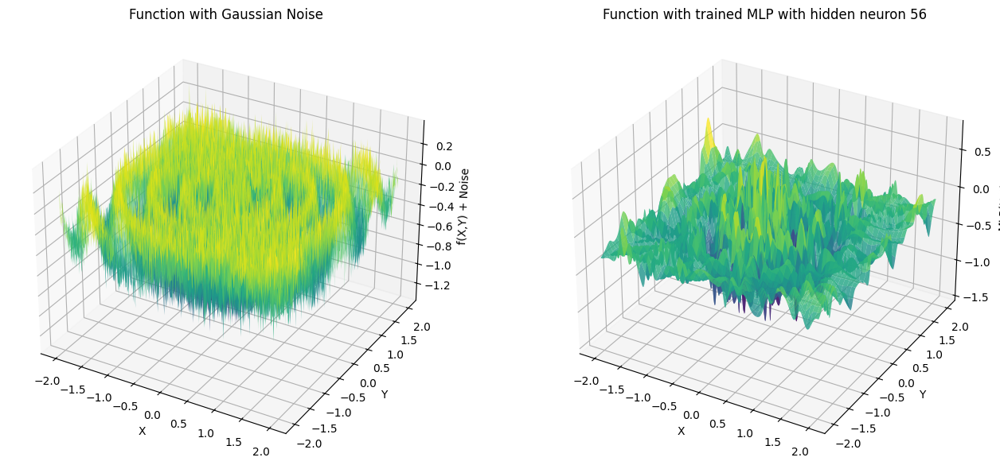

hidden neurons number:  72 of rmse score is  0.22575943652257643
hidden neurons number:  72 of rmse score is  0.20971477906736122
hidden neurons number:  72 of rmse score is  0.2202089437299429


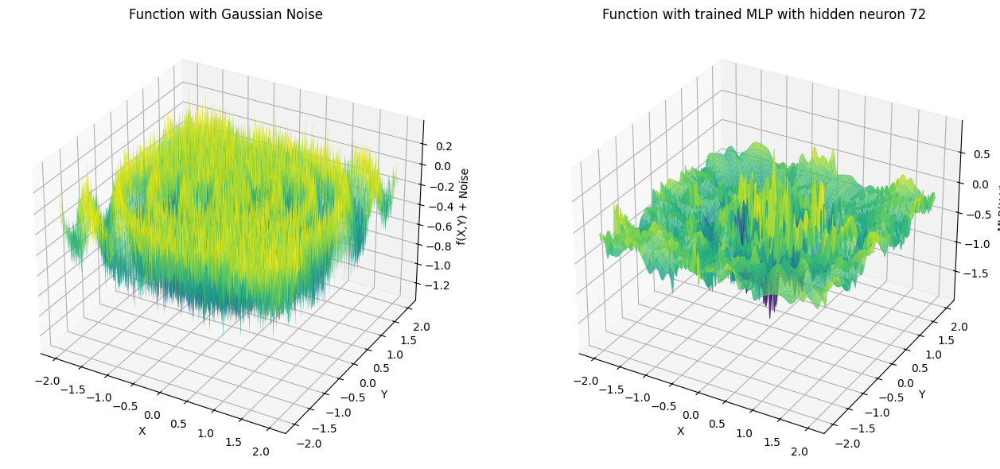

Best hidden layer size: 56 with RMSE: 0.21312190610346582
At that time, test RMSE is[0.207233773786799]
test 2 -fold start
hidden neurons number:  8 of rmse score is  0.25350332556359034
hidden neurons number:  8 of rmse score is  0.25514709541653363
hidden neurons number:  8 of rmse score is  0.2631139168868489


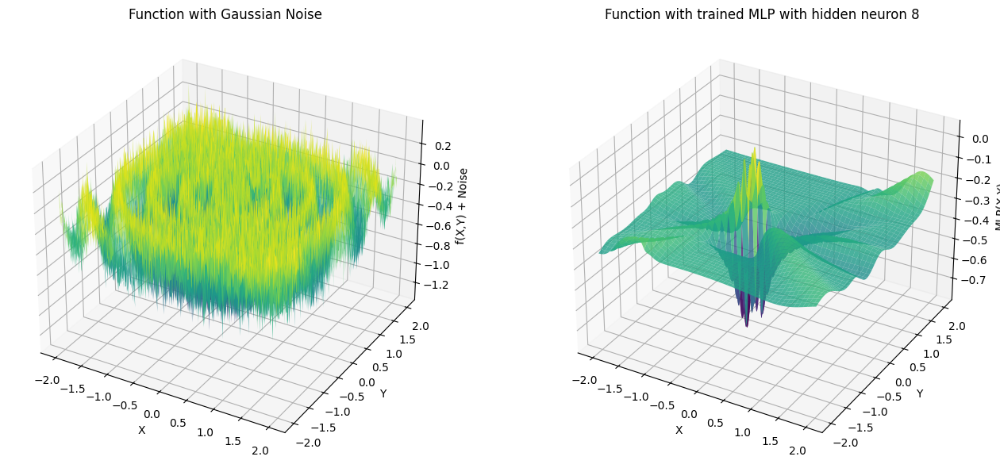

hidden neurons number:  24 of rmse score is  0.23979862963304346
hidden neurons number:  24 of rmse score is  0.24339707067398333
hidden neurons number:  24 of rmse score is  0.23728699093027583


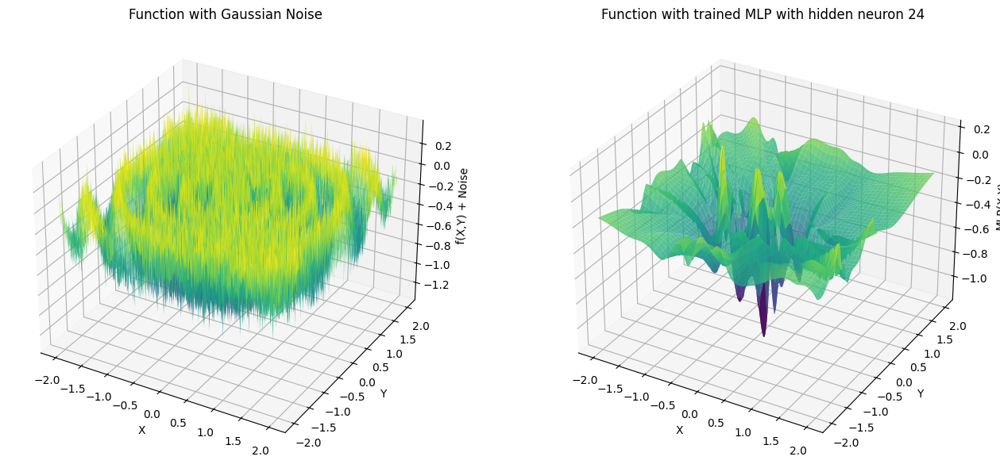

hidden neurons number:  40 of rmse score is  0.2296568011808374
hidden neurons number:  40 of rmse score is  0.24943196581684438
hidden neurons number:  40 of rmse score is  0.2297971306186432


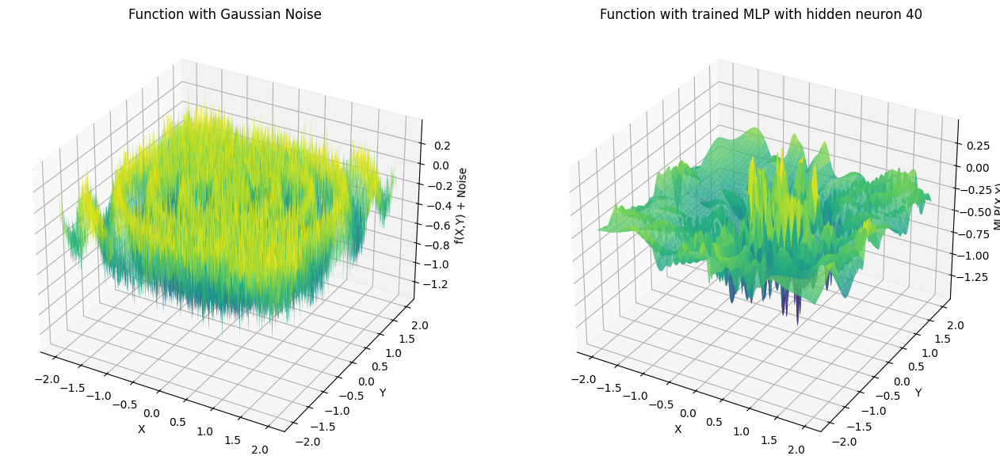

hidden neurons number:  56 of rmse score is  0.2289930554170814
hidden neurons number:  56 of rmse score is  0.2247551781638446
hidden neurons number:  56 of rmse score is  0.22534292310703877


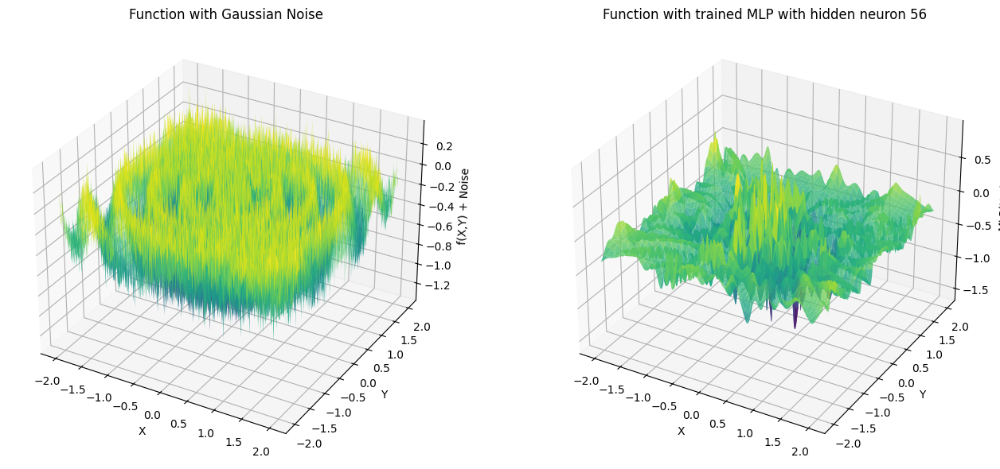

hidden neurons number:  72 of rmse score is  0.19735465172450525
hidden neurons number:  72 of rmse score is  0.2165723547303992
hidden neurons number:  72 of rmse score is  0.2064667995299861


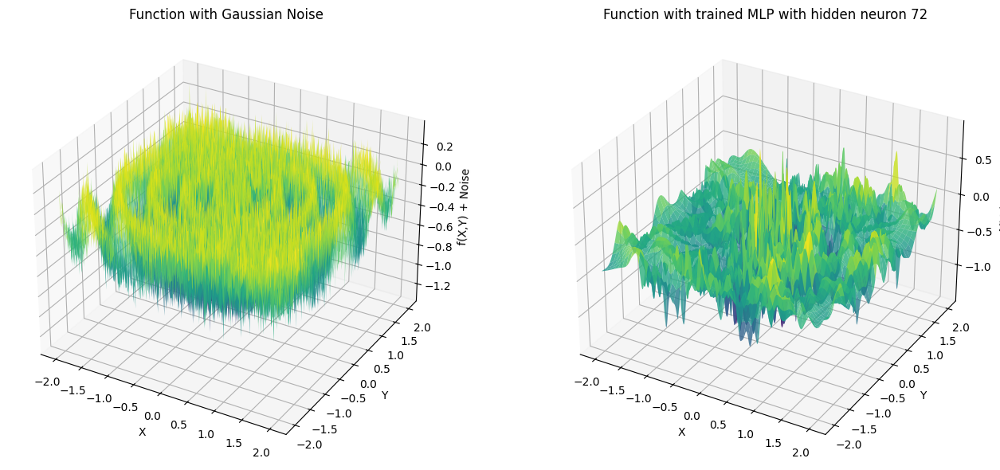

Best hidden layer size: 72 with RMSE: 0.20679793532829685
At that time, test RMSE is[0.2073890823063396]
test 3 -fold start
hidden neurons number:  8 of rmse score is  0.25301999511953077
hidden neurons number:  8 of rmse score is  0.25567046566177876
hidden neurons number:  8 of rmse score is  0.2525665933253098


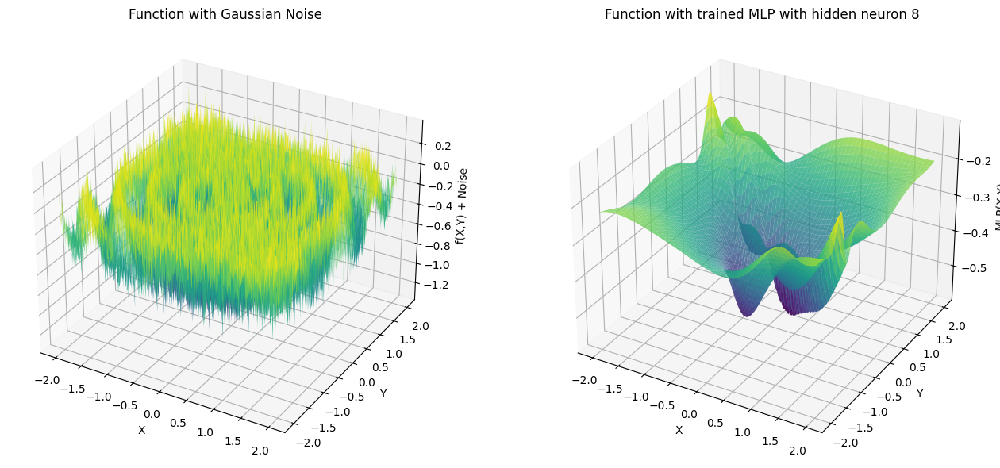

hidden neurons number:  24 of rmse score is  0.24104998731192145
hidden neurons number:  24 of rmse score is  0.23848008204935503
hidden neurons number:  24 of rmse score is  0.23862016532296626


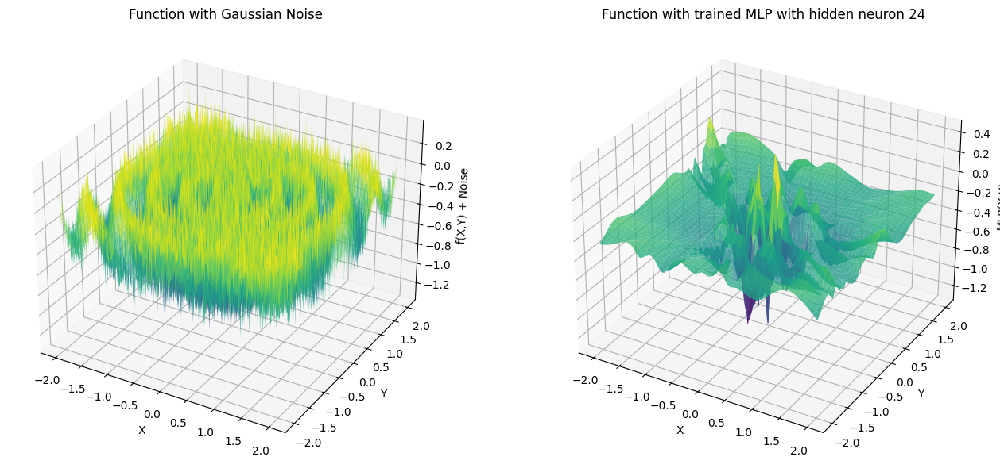

hidden neurons number:  40 of rmse score is  0.22031387183082907
hidden neurons number:  40 of rmse score is  0.23068339614318617
hidden neurons number:  40 of rmse score is  0.23476853000233128


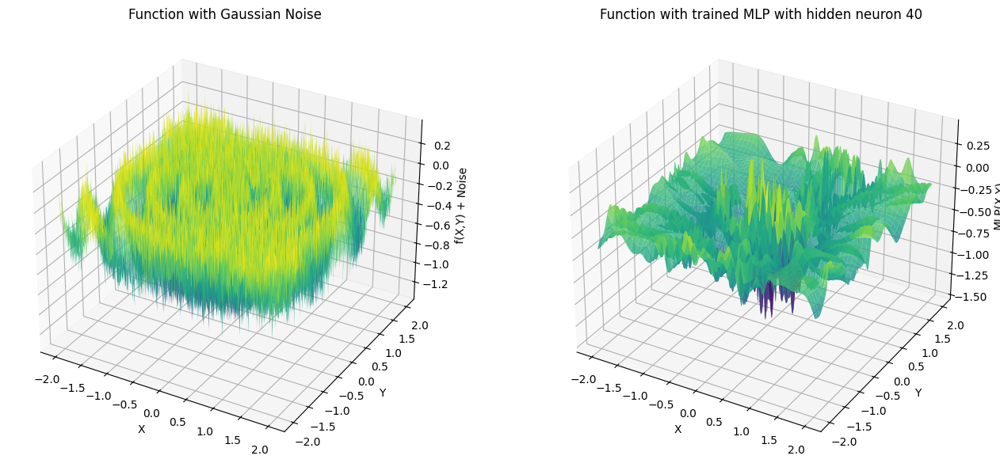

hidden neurons number:  56 of rmse score is  0.22616858558880917
hidden neurons number:  56 of rmse score is  0.22005259621611684
hidden neurons number:  56 of rmse score is  0.21814585278489523


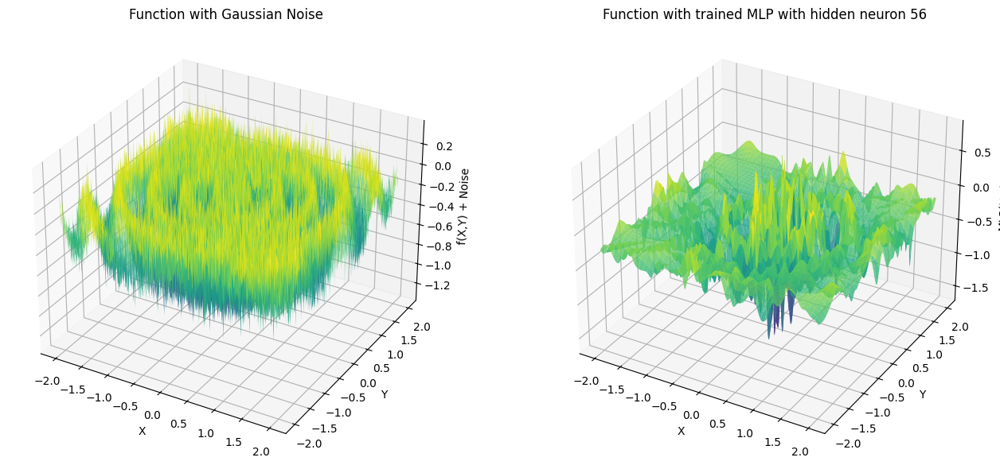

hidden neurons number:  72 of rmse score is  0.2121197251131679
hidden neurons number:  72 of rmse score is  0.2173407832861682
hidden neurons number:  72 of rmse score is  0.2146424452896945


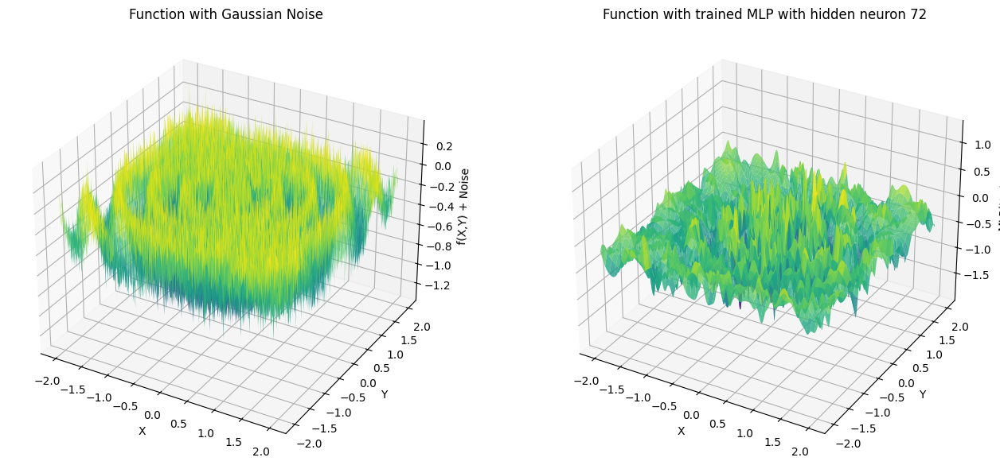

Best hidden layer size: 72 with RMSE: 0.2147009845630102
At that time, test RMSE is[0.21510463768417543]


In [16]:
#K-fold configuration

#define model for adjustment
class MLP(nn.Module):
    def __init__(self, num_hidden_neurons):
        super(MLP, self).__init__()
        self.layer1 = nn.Linear(2, num_hidden_neurons)
        self.tanh = nn.Tanh()
        self.layer2 = nn.Linear(num_hidden_neurons, num_hidden_neurons)
        self.tanh = nn.Tanh()
        self.layer3 = nn.Linear(num_hidden_neurons, num_hidden_neurons)
        self.tanh = nn.Tanh()
        self.layer4 = nn.Linear(num_hidden_neurons, 1)
        
        #standard Gaussian initialization 
        nn.init.normal_(self.layer1.weight, mean = 0., std = 1.)
        nn.init.normal_(self.layer2.weight, mean = 0., std = 1.)
        nn.init.normal_(self.layer3.weight, mean = 0., std = 1.)
        nn.init.normal_(self.layer4.weight, mean = 0., std = 1.)
        # nn.init.xavier_uniform_(self.layer1.weight)
        # nn.init.xavier_uniform_(self.layer2.weight)

    def forward(self, x):
        return self.layer4(self.tanh(self.layer3(self.tanh(self.layer2(self.tanh(self.layer1(x)))))))

hidden_layer_sizes = [8, 24, 40, 56, 72]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
epochs = 30

for testfold in range(3):
    print(f"test {testfold+1} -fold start")
    # Create PyTorch datasets for the current fold
    X_select, X_test, y_select, y_test = train_test_split(features, targets, test_size=0.15)
    X_test_torch = torch.tensor(X_test, dtype=torch.float32)
    y_test_torch = torch.tensor(y_test, dtype=torch.float32).view(-1, 1)
    testdataaset = TensorDataset(X_test_torch, y_test_torch)
    test_loader = DataLoader(testdataaset, batch_size=512, shuffle=False)
    #Dictionary to store the RMSE for each hidden layer size
    rmse_scores = {size: [] for size in hidden_layer_sizes}  
    test_scores = {size: [] for size in hidden_layer_sizes} 
    for hidden_size in hidden_layer_sizes:
         
        for fold in range(3):
            X_train, X_val, y_train, y_val = train_test_split(X_select, y_select, test_size=3/17)

            X_torch = torch.tensor(X_train, dtype=torch.float32)
            y_torch = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)
            X_val_torch = torch.tensor(X_val, dtype=torch.float32)
            y_val_torch = torch.tensor(y_val, dtype=torch.float32).view(-1, 1)

            traindataset = TensorDataset(X_torch, y_torch)
            valdataset = TensorDataset(X_val_torch, y_val_torch)
            
            train_loader = DataLoader(traindataset, batch_size=32, shuffle=True)
            val_loader = DataLoader(valdataset, batch_size=32, shuffle=False)      
        
            mlp = MLP(hidden_size).to(device)

            # Define the loss function and the optimizer
            criterion = nn.MSELoss()
            optimizer = optim.SGD(mlp.parameters(), lr=1e-3)            
            scheduler = optim.lr_scheduler.StepLR(optimizer,step_size = 10, gamma = 0.5)

            # Train the model for the current fold
            mlp.train()
            for epoch in range(epochs):
                for X_batch, y_batch in train_loader:
                    X_batch = X_batch.to(device)
                    y_batch = y_batch.to(device)
                    optimizer.zero_grad()
                    output = mlp(X_batch)
                    loss = criterion(output, y_batch)
                    loss.backward()
                    optimizer.step()
            scheduler.step()
            # Evaluate the model on the validation set for the current fold
            mlp.eval()
            with torch.no_grad():
                val_losses = []
                for X_batch, y_batch in val_loader:
                    X_batch = X_batch.to(device)
                    y_batch = y_batch.to(device)
                    val_predictions = mlp(X_batch)
                    val_loss = criterion(val_predictions, y_batch)
                    val_losses.append(val_loss.item())
                fold_rmse = np.sqrt(np.mean(val_losses))
                rmse_scores[hidden_size].append(fold_rmse)            
            print("hidden neurons number: " ,hidden_size,"of rmse score is ", fold_rmse)
        plot3d(mlp,features,device,hidden_size)

        with torch.no_grad():
            test_losses = []
            for X_batch, y_batch in test_loader:
                X_batch = X_batch.to(device)
                y_batch = y_batch.to(device)
                test_predictions = mlp(X_batch)
                test_loss = criterion(test_predictions, y_batch)
                test_losses.append(test_loss.item())
            fold_rmse = np.sqrt(np.mean(test_losses))
            test_scores[hidden_size].append(fold_rmse)
     
    # Calculate the average RMSE for each hidden layer size
    average_rmse_scores = {size: np.mean(scores) for size, scores in rmse_scores.items()}
    # Find the hidden layer size with the lowest average RMSE
    best_hidden_size = min(average_rmse_scores, key=average_rmse_scores.get)
    best_rmse = average_rmse_scores[best_hidden_size]

    print(f"Best hidden layer size: {best_hidden_size} with RMSE: {best_rmse}")
    print(f"At that time, test RMSE is{test_scores[best_hidden_size]}")       